In [1]:
import os, sys
my_path = os.getcwd()+"/.."
print(my_path)
sys.path.append(my_path)

from IPython.display import HTML

import tempfile
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline


#Ensembler
##COde
from ensembler.potentials.OneD import harmonicOscillator
from ensembler.integrator.stochastic import monteCarloIntegrator, metropolisMonteCarloIntegrator
from ensembler.integrator.newtonian import positionVerletIntegrator #, leapFrogIntegrator
from ensembler.system import system

##Visualisation
from ensembler.visualisation.plotSimulations import static_sim_plots
from ensembler.visualisation.animationSimulation import animation_trajectory, animation_EDS_trajectory


c:\Users\benja\OneDrive - ETH Zürich\PhD\Code\ensembler_public\examples/..


# Executing Simulations

## Stochastic Integrators

### Metropolis 

In [2]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=100

##Simulation Setup
pot=harmonicOscillator(k=2)
integrator = monteCarloIntegrator() 
sys=system(potential=pot, integrator=integrator,  position=0)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print()
print("last_state: ", cur_state)
print(len(sys.trajectory))

sys.trajectory.head()




last_state:  State(position=-0.5430432728884067, temperature=298.0, totEnergy=0.29489599622935253, totPotEnergy=0.29489599622935253, totKinEnergy=nan, dhdpos=-0.2102799231797653, velocity=nan)
101


,position,temperature,totEnergy,totPotEnergy,totKinEnergy,dhdpos,velocity
0,0.000000,298.0,0.000000,0.000000,NaN,0.000000,NaN
1,0.221680,298.0,0.049142,0.049142,NaN,0.221680,NaN
2,0.525443,298.0,0.276091,0.276091,NaN,0.303763,NaN
3,0.116653,298.0,0.013608,0.013608,NaN,-0.408791,NaN
4,-0.325555,298.0,0.105986,0.105986,NaN,-0.442208,NaN


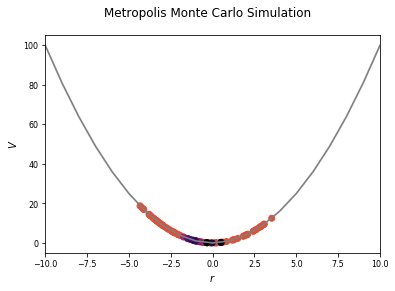

In [3]:

#plot simulation
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:

os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())

{'bodies': [<matplotlib.collections.PolyCollection object at 0x000001A6B0741B08>]}


(None, <Figure size 1152x288 with 3 Axes>)

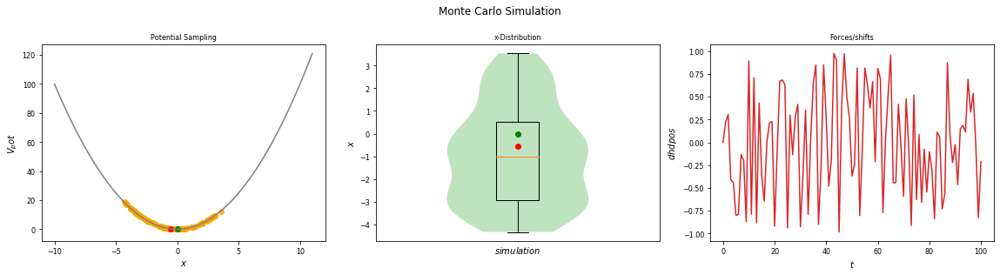

In [4]:
#static plot
static_sim_plots(sys, title="Monte Carlo Simulation", x_range=list(range(-10,11)))

### Metropolis Monte Carlo

In [5]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=100
pot=harmonicOscillator(k=2)
integrator = metropolisMonteCarloIntegrator(randomnessIncreaseFactor=5) 
sys=system(potential=pot, integrator=integrator,  position=9)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print()
print("last_state: ", cur_state)
print(len(sys.trajectory))
sys.trajectory.head()




last_state:  State(position=2.324969016980119, temperature=298.0, totEnergy=5.4054809299175, totPotEnergy=5.4054809299175, totKinEnergy=nan, dhdpos=-0.5936003293985797, velocity=None)
101


,position,temperature,totEnergy,totPotEnergy,totKinEnergy,dhdpos,velocity
0,9.000000,298.0,81.000000,81.000000,NaN,18.000000,NaN
1,8.930807,298.0,79.759316,79.759316,NaN,-0.069193,NaN
2,8.203438,298.0,67.296401,67.296401,NaN,-0.727369,NaN
3,7.294901,298.0,53.215583,53.215583,NaN,-0.908537,NaN
4,7.306376,298.0,53.383133,53.383133,NaN,0.011475,NaN


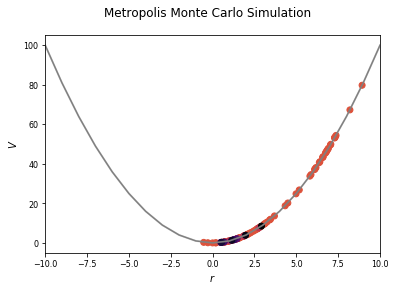

In [6]:
#plot
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:
os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())


{'bodies': [<matplotlib.collections.PolyCollection object at 0x000001A6B1351C48>]}


(None, <Figure size 1152x288 with 3 Axes>)

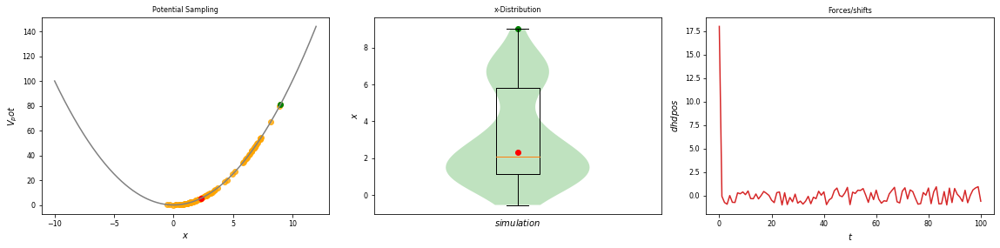

In [7]:
#plot
static_sim_plots(sys, x_range=[-10,11])

## Newtonian Integrators

### Position Verlet

In [8]:
#Simple Verlet integration simulation:
#UNDER DEVELOPMENT!The temperature is not constant!!! -- BUGGY!
#settings
sim_steps = 200
x_min, x_max = (-10, 10)
max_step_size = 2.0

#Simulation Setup
pot=harmonicOscillator()
integrator = positionVerletIntegrator(dt=0.1)
sys=system(potential=pot, integrator=integrator, position=-7.5)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)

print("Trajectory length: ",len(sys.trajectory))



Trajectory length:  201


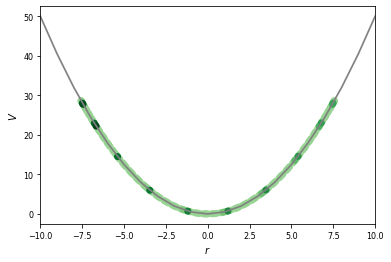

In [15]:
#animation
ani, out_path = animation_trajectory(sys, [x_min, x_max])

os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())

In [8]:
#plot
static_sim_plots(sys, title="position Verlet", x_range=list(range(-10,11)))

StopIteration: 